# CS 671 Fall 2024 Final Project
# Final Report: Predicting Airbnb Prices in New York City

## Introduction

This project is part of the Fall 2024 CS 671 Final Project Kaggle Competition. The goal is to predict the prices of Airbnbs in New York City based on a variety of features, including location, amenities, host details, and availability. By leveraging feature engineering, machine learning, and model evaluation techniques, this project explores how to extract valuable insights from a real-world, somewhat messy dataset. This competition provided a hands-on opportunity to apply advanced data processing and predictive modeling techniques to solve a challenging problem in the context of real-world data.


# Section 0: Project Description


Before that, we need to load the data from the connected google drive.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import pandas as pd

train_data = pd.read_csv('/content/drive/My Drive/Kaggle/cs-671-fall-2024-final-project/train.csv')
test_data = pd.read_csv('/content/drive/My Drive/Kaggle/cs-671-fall-2024-final-project/test.csv')
sample_submission = pd.read_csv('/content/drive/My Drive/Kaggle/cs-671-fall-2024-final-project/sample_submission.csv')
test_data_with_ID = test_data
# Drop the 'id' column from test_data
test_data = test_data.drop('id', axis=1)

In [ ]:
!pip install folium geopandas

# Section 1: Exploratory Analysis

## Section 1.1: Data Overview and Initial Inspection

## Data Preprocessing and Unique Features

### Overview of Data Preprocessing Pipeline

To handle the real-world Airbnb dataset effectively, we designed a comprehensive data preprocessing pipeline that systematically transforms raw data into a structured format suitable for machine learning models. Our pipeline consists of several steps, each tailored to extract meaningful insights and ensure data quality:

1. **Parsing and Clustering Amenities**:
   - We calculated the number of amenities available for each Airbnb listing.
   - Using **Sentence Transformers**, we generated embeddings for the amenities text, capturing semantic relationships between different amenities.
   - To group listings with similar amenities, we applied **K-Means clustering** to the embeddings and performed one-hot encoding for the resulting clusters. This approach provides a compact yet powerful representation of amenities, distinguishing our preprocessing from conventional techniques.

2. **Handling Geolocation**:
   - Latitude and longitude coordinates were clustered using **K-Means**, creating a new feature (`geo_cluster`) that captures regional variations in price.

3. **Categorical Encoding**:
   - Columns like `neighbourhood_group_cleansed`, `property_type`, and `room_type` were one-hot encoded for compatibility with machine learning models.
   - `host_response_time` was mapped to ordinal values to retain meaningful temporal information.

4. **Date Processing**:
   - Columns like `host_since` and `last_review` were converted to the number of days since the respective dates, enabling temporal analysis.

5. **Boolean Conversion**:
   - All boolean columns were converted to integers for seamless integration into machine learning models.

6. **Handling Missing Values**:
   - Missing values in numerical columns were imputed using the median strategy to minimize data loss.

7. **Feature Selection and Engineering**:
   - Interaction features, ratio features, and polynomial features were added to enhance predictive power.
   - Group-level statistics (e.g., average price by geo-cluster) were computed to incorporate higher-level insights.

### Unique Features of the Pipeline

- **Semantic Clustering of Amenities**:
   - By leveraging advanced NLP techniques and clustering, we created features that go beyond simple one-hot encoding. This approach captures relationships between amenities, making it a standout feature of our pipeline.

- **Geolocation-Based Clustering**:
   - Clustering latitude and longitude into geo-clusters allows us to include spatial context in our models, helping capture neighborhood-level price trends effectively.

- **Interpretable Feature Engineering**:
   - Each feature was carefully designed to be interpretable, ensuring that the models could provide actionable insights rather than being treated as black boxes.

This preprocessing pipeline serves as the foundation for our modeling approach, ensuring that we extract the maximum value from the data while maintaining interpretability and robustness.


In [ ]:
import pandas as pd
import ast
import re
from sentence_transformers import SentenceTransformer
import torch
import numpy as np
from sklearn.cluster import KMeans
from sklearn.impute import SimpleImputer
from collections import Counter

class AirbnbDataProcessor:
    def __init__(self, train_data):
        self.train_data = train_data
        self.processed_train_data = pd.DataFrame()
        self.device = 'cuda' if torch.cuda.is_available() else 'cpu'
        self.model = SentenceTransformer('paraphrase-MiniLM-L6-v2').to(self.device)

    def parse_amenities(self):
        # Process amenities count
        self.processed_train_data['amenities_count'] = self.train_data['amenities'].apply(
            lambda x: len(x.replace('[', '').replace(']', '').replace('"', '').split(', '))
        )
        self.processed_train_data['amenities'] = self.train_data['amenities']

        # Generate amenities embeddings
        self.processed_train_data['amenities_str'] = self.processed_train_data['amenities'].apply(
            lambda x: ' '.join(x.replace('[', '').replace(']', '').replace('"', '').split(', '))
        )
        self.processed_train_data['amenities_embeddings'] = self.processed_train_data['amenities_str'].apply(
            lambda x: self.model.encode(x, device=self.device)
        )

    def cluster_amenities(self, n_clusters=10):
        # Convert embeddings to array and cluster
        embeddings = np.vstack(self.processed_train_data['amenities_embeddings'].values)
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        self.processed_train_data['amenities_cluster'] = kmeans.fit_predict(embeddings)

        # One-Hot Encoding for clusters
        self.processed_train_data = pd.get_dummies(
            self.processed_train_data, columns=['amenities_cluster'], prefix='cluster'
        )
        self.processed_train_data.drop(
            columns=['amenities', 'amenities_str', 'amenities_embeddings'], inplace=True
        )

    def process_other_columns(self):
        # Add numeric and boolean columns
        self.processed_train_data = pd.concat(
            [self.processed_train_data, self.train_data.select_dtypes(include=['int64', 'float64', 'bool'])],
            axis=1
        )

        # Process neighbourhood group
        one_hot_encoded = pd.get_dummies(self.train_data['neighbourhood_group_cleansed'], prefix='neigh_group')
        self.processed_train_data = pd.concat([self.processed_train_data, one_hot_encoded], axis=1)

        # Host response time conversion
        self.processed_train_data['host_response_time'] = self.train_data['host_response_time'].map({
            "within an hour": 1,
            "within a few hours": 2,
            "within a day": 3,
            "a few days or more": 4
        }).fillna(5)

    def classify_property_type(self):
        # Categorize property type
        def classify(property_type):
            if 'Entire' in property_type:
                return 'Entire Place'
            elif 'Private room' in property_type:
                return 'Private Room'
            elif 'Shared room' in property_type:
                return 'Shared Room'
            else:
                return 'Other'

        self.processed_train_data['property_type_category'] = self.train_data['property_type'].apply(classify)
        property_type_encoded = pd.get_dummies(
            self.processed_train_data['property_type_category'], prefix='property_type'
        )
        self.processed_train_data = pd.concat([self.processed_train_data, property_type_encoded], axis=1)
        self.processed_train_data.drop(columns=['property_type_category'], inplace=True)

    def cluster_geolocation(self, n_clusters=10):
        # Geolocation clustering
        coords = self.train_data[['latitude', 'longitude']].values
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        self.processed_train_data['geo_cluster'] = kmeans.fit_predict(coords)

    def process_room_type(self):
        # One-Hot Encode room type
        room_type_encoded = pd.get_dummies(self.train_data['room_type'], prefix='room_type')
        self.processed_train_data = pd.concat([self.processed_train_data, room_type_encoded], axis=1)

    def process_dates(self):
        # Convert date columns to datetime
        self.processed_train_data['host_since'] = pd.to_datetime(self.train_data['host_since'], errors='coerce')
        self.processed_train_data['last_review'] = pd.to_datetime(self.train_data['last_review'], errors='coerce')

        # Calculate days since host_since and last_review
        self.processed_train_data['host_since'] = (
            pd.to_datetime('today') - self.processed_train_data['host_since']
        ).dt.days
        self.processed_train_data['last_review'] = (
            pd.to_datetime('today') - self.processed_train_data['last_review']
        ).dt.days

    def process_boolean_columns(self):
        # Convert boolean columns to integers
        bool_columns = self.processed_train_data.select_dtypes(include=['bool']).columns
        for col in bool_columns:
            self.processed_train_data[col] = self.processed_train_data[col].astype(int)

    def handle_missing_values(self):
        # Impute missing values
        imputer = SimpleImputer(strategy='median')
        numeric_cols = self.processed_train_data.select_dtypes(include=['float64', 'int64']).columns
        self.processed_train_data[numeric_cols] = imputer.fit_transform(
            self.processed_train_data[numeric_cols]
        )

    def process_all(self):
        # Execute all steps
        self.parse_amenities()
        self.cluster_amenities()
        self.process_other_columns()
        self.classify_property_type()
        self.cluster_geolocation()
        self.process_room_type()
        self.process_dates()
        self.process_boolean_columns()
        self.handle_missing_values()

        return self.processed_train_data


/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:13: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange


## Section 1.2: Feature Engineering

## 1.2 Feature Engineering Pipeline

### Overview of Feature Engineering Techniques

Our feature engineering pipeline is designed to extract meaningful patterns and enhance predictive performance. Below are the key techniques employed:

1. **Interaction Features**:
   - We created interaction terms between key variables to capture relationships, such as combining `Entire Place` and `Private Room` features into `Entire_Private_Room`.
   - This adds flexibility for the model to learn complex dependencies between features.

2. **Ratio-Based Features**:
   - New ratio features, such as `reviews_per_month_ratio`, were engineered by dividing the number of reviews by the monthly review count.
   - This normalizes review data, making it more comparable across listings with varying activity levels.

3. **Clustering Features**:
   - Using geolocation data (`latitude` and `longitude`), we applied **K-Means clustering** to create a new feature, `geo_cluster_new`.
   - This feature groups nearby listings to capture regional trends in price.

4. **Temporal Features**:
   - Extracted temporal information such as the day of the week (`last_review_weekday`) and the month (`last_review_month`) from review timestamps.
   - These features allow the model to consider time-dependent patterns in bookings.

5. **Log Transformation**:
   - Log transformation was applied to skewed variables like `minimum_nights`, `maximum_nights`, and `number_of_reviews` to reduce the impact of outliers.
   - This stabilizes variance and makes the data distribution more suitable for modeling.

6. **Feature Binning**:
   - Continuous features like `accommodates` were binned into categories such as `Small`, `Medium`, `Large`, and `Extra Large`.
   - This enhances interpretability and captures non-linear effects in a simpler way.

7. **Group Statistics**:
   - Aggregated statistics (e.g., mean and median) of `price` were calculated for each `geo_cluster`.
   - These higher-level features summarize the pricing trends within geographic clusters.

8. **Distance to City Center**:
   - Calculated the Euclidean distance of each listing from the center of New York City.
   - This feature captures the location's influence on price and demand.

9. **Text-Based Features**:
   - Generated `description_length` by measuring the number of characters in each listing's description, reflecting the level of detail provided by hosts.

10. **Rating Ratios**:
    - Features like `cleanliness_value_ratio` were created by dividing `review_scores_cleanliness` by `review_scores_value + 1`.
    - This balances the relative importance of cleanliness and overall value.

11. **Amenity-Based Features**:
    - A flag, `has_pool`, was added to indicate whether a listing includes a swimming pool based on the amenities list.
    - This feature highlights listings with premium amenities.

12. **Polynomial Features**:
    - Polynomial interactions and higher-order terms for `latitude` and `longitude` were generated to capture complex spatial relationships.

### Highlights and Innovation

- **Advanced Clustering**: By clustering geolocation and amenity embeddings, we introduced high-impact features that leverage spatial and semantic patterns.
- **Balanced Feature Design**: Our pipeline incorporates a mix of engineered and aggregated features to improve prediction accuracy while maintaining interpretability.
- **Interpretability Focus**: Many of our engineered features, such as `reviews_per_month_ratio` and `geo_cluster_price_mean`, are straightforward and provide clear insights into the underlying data.

The feature engineering pipeline significantly enriches the dataset, preparing it for robust and interpretable modeling.


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans


class FeatureEngineeringPipeline:
    def __init__(self, data, is_train=True, kmeans_model=None):
        """
        Initialize the pipeline.

        Args:
            data: DataFrame to process.
            is_train: Whether this is train_data or test_data.
            kmeans_model: Pre-fitted KMeans model for test_data.
        """
        self.data = data
        self.transformed_data = data.copy()
        self.is_train = is_train
        self.kmeans_model = kmeans_model

    def add_interaction_features(self):
        """Add interaction features between high-impact variables."""
        self.transformed_data['Entire_Private_Room'] = (
            self.transformed_data['property_type_Entire Place'] * self.transformed_data['property_type_Private Room']
        )
        print("Added interaction features.")

    def add_ratio_features(self):
        """Add ratio-based features."""
        self.transformed_data['reviews_per_month_ratio'] = (
            self.transformed_data['number_of_reviews'] / (self.transformed_data['reviews_per_month'] + 1)
        )
        print("Added ratio features.")

    def add_clustering_features(self, n_clusters=10):
        """Add clustering-based features."""
        coords = self.transformed_data[['latitude', 'longitude']].values

        if self.is_train:
            self.kmeans_model = KMeans(n_clusters=n_clusters, random_state=42)
            self.transformed_data['geo_cluster_new'] = self.kmeans_model.fit_predict(coords)
        else:
            if self.kmeans_model is None:
                raise ValueError("KMeans model must be provided for test data.")
            self.transformed_data['geo_cluster_new'] = self.kmeans_model.predict(coords)

        print("Added clustering features.")

    def add_temporal_features(self):
        """Add temporal features."""
        self.transformed_data['last_review_weekday'] = pd.to_datetime(self.data['last_review'], errors='coerce').dt.weekday
        self.transformed_data['last_review_month'] = pd.to_datetime(self.data['last_review'], errors='coerce').dt.month
        print("Added temporal features.")

    def log_transform_skewed_features(self, features):
        """Apply log transformation to skewed features."""
        for feature in features:
            self.transformed_data[f'log_{feature}'] = np.log1p(self.transformed_data[feature])
        print(f"Applied log transformation to features: {features}")

    def bin_continuous_features(self, feature, bins, labels):
        """Bin continuous variables into categories."""
        self.transformed_data[f'{feature}_bin'] = pd.cut(
            self.transformed_data[feature], bins=bins, labels=labels
        )
        print(f"Binned feature '{feature}' into categories.")

    def add_group_statistics(self, group_by, target, stats=['mean', 'median']):
        """Add aggregated statistics by group."""
        if self.is_train:
            for stat in stats:
                new_feature = f'{group_by}_{target}_{stat}'
                self.transformed_data[new_feature] = self.transformed_data.groupby(group_by)[target].transform(stat)
            print(f"Added group statistics for '{target}' grouped by '{group_by}'.")
        else:
            print(f"Skipped group statistics for test data (no target '{target}').")

    def add_distance_to_center(self, center_coords):
        """Add distance to city center as a feature."""
        self.transformed_data['distance_to_center'] = np.sqrt(
            (self.transformed_data['latitude'] - center_coords[0])**2 +
            (self.transformed_data['longitude'] - center_coords[1])**2
        )
        print("Added distance to center feature.")

    def add_text_length_feature(self):
        """Add text length as a feature."""
        if 'description' in self.data.columns:
            self.transformed_data['description_length'] = self.data['description'].apply(lambda x: len(str(x)))
            print("Added text length feature.")

    def add_rating_ratios(self):
        """Add rating ratios."""
        self.transformed_data['cleanliness_value_ratio'] = (
            self.transformed_data['review_scores_cleanliness'] / (self.transformed_data['review_scores_value'] + 1)
        )
        print("Added rating ratios.")

    def combine_amenities(self):
        """Create flags for specific amenities from amenities_count."""
        self.transformed_data['has_pool'] = self.data['amenities_count'].apply(
            lambda x: 1 if 'Pool' in str(x) else 0
        )
        print("Added amenity-based features.")

    def add_polynomial_features(self, features, degree=2, interaction_only=True):
        """Generate polynomial and interaction terms."""
        poly = PolynomialFeatures(degree=degree, interaction_only=interaction_only, include_bias=False)
        poly_features = poly.fit_transform(self.transformed_data[features])
        feature_names = poly.get_feature_names_out(features)
        poly_df = pd.DataFrame(poly_features, columns=feature_names, index=self.transformed_data.index)
        self.transformed_data = pd.concat([self.transformed_data, poly_df], axis=1)
        print("Added polynomial features.")

    def drop_unwanted_columns(self, columns):
        """Remove unwanted columns from the dataset."""
        self.transformed_data.drop(columns=columns, inplace=True, errors='ignore')
        print(f"Dropped columns: {columns}")

    def process_pipeline(self):
        """Run the entire pipeline."""
        self.add_interaction_features()
        self.add_ratio_features()
        self.add_clustering_features()
        self.add_temporal_features()
        self.log_transform_skewed_features(['minimum_nights', 'maximum_nights', 'number_of_reviews'])
        self.bin_continuous_features(
            'accommodates', bins=[0, 2, 4, 6, np.inf], labels=['Small', 'Medium', 'Large', 'Extra Large']
        )
        if self.is_train:
            self.add_group_statistics('geo_cluster', 'price', stats=['mean', 'median'])
        ####### new added on ######
        self.add_distance_to_center(center_coords=(40.7128, -74.0060))  # Example for NYC center
        self.add_text_length_feature()
        self.add_rating_ratios()
        ####### new added on ######
        self.combine_amenities()
        self.add_polynomial_features(['latitude', 'longitude'], degree=2)

    def get_data(self):
        """Return the transformed dataset."""
        return self.transformed_data, self.kmeans_model


**Clustering display**

In [ ]:
from sklearn.cluster import KMeans

def get_neighbourhood_clusters(data, latitude_col, longitude_col, neighbourhood_col, n_clusters=10):
    """
    Cluster the geographic locations and view the names of the neighborhoods contained in each cluster.

    Parameters:
    - data: DataFrame, dataset containing geographic information
    - latitude_col: str, latitude column name
    - longitude_col: str, longitude column name
    - neighbourhood_col: str, neighborhood column name
    - n_clusters: int, number of clusters

    Returns:
    - clusters_neighbourhoods: Series, list of neighborhoods corresponding to each cluster
    """

    coords = data[[latitude_col, longitude_col]].values
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    data['geo_cluster'] = kmeans.fit_predict(coords)
    clusters_neighbourhoods = data.groupby('geo_cluster')[neighbourhood_col].unique()

    for cluster_id, neighbourhoods in clusters_neighbourhoods.items():
        print(f"Cluster {cluster_id}:")
        print(neighbourhoods)
        print("-" * 50)

    return clusters_neighbourhoods

clusters = get_neighbourhood_clusters(
    train_data,
    latitude_col='latitude',
    longitude_col='longitude',
    neighbourhood_col='neighbourhood_cleansed',
    n_clusters=10
)

## Check for duplicate columns
# print(processed_train_data.columns.duplicated().sum())

# Remove duplicate columns (if any)
processed_train_data = processed_train_data.loc[:, ~processed_train_data.columns.duplicated()]


Cluster 0:
['Flatbush' 'Prospect-Lefferts Gardens' 'East Flatbush' 'South Slope'
 'Coney Island' 'Sunset Park' 'Bay Ridge' 'Gravesend' 'Sheepshead Bay'
 'Midwood' 'Flatlands' 'Brighton Beach' 'Park Slope' 'Bensonhurst'
 'Bath Beach' 'Sea Gate' 'Kensington' 'Windsor Terrace' 'Gowanus'
 'Manhattan Beach' 'Mill Basin' 'Red Hook' 'Borough Park'
 'Carroll Gardens' 'Dyker Heights' 'Fort Hamilton' 'Gerritsen Beach'
 'Crown Heights']
--------------------------------------------------
Cluster 1:
['Midtown' 'Upper West Side' "Hell's Kitchen" 'Chinatown'
 'Lower East Side' 'Murray Hill' 'Chelsea' 'Financial District' 'Kips Bay'
 'Greenwich Village' 'SoHo' 'West Village' 'Tribeca' 'East Village'
 'Greenpoint' 'Theater District' 'Nolita' 'Long Island City'
 'Civic Center' 'Upper East Side' 'Little Italy' 'Flatiron District'
 'Battery Park City' 'Gramercy' 'Two Bridges' 'Stuyvesant Town'
 'Roosevelt Island' 'NoHo']
--------------------------------------------------
Cluster 2:
['Little Neck' 'Springf

In [ ]:

import folium
from folium.plugins import MarkerCluster
import pandas as pd

# Create a DataFrame of clustered data (assuming the data has been processed)
cluster_data = train_data[['latitude', 'longitude', 'geo_cluster']]

# Initialize the map and set the center point of New York
nyc_map = folium.Map(location=[40.7128, -74.0060], zoom_start=11)

# Create a color list, one color for each cluster
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred',
          'beige', 'darkblue', 'darkgreen', 'cadetblue', 'pink']

# Traverse the clustering results and add each point to the map
for cluster_id in cluster_data['geo_cluster'].unique():
    cluster_points = cluster_data[cluster_data['geo_cluster'] == cluster_id]
    marker_cluster = MarkerCluster(name=f'Cluster {cluster_id}').add_to(nyc_map)

    for _, row in cluster_points.iterrows():
        folium.CircleMarker(
            location=(row['latitude'], row['longitude']),
            radius=3,
            color=colors[cluster_id % len(colors)],
            fill=True,
            fill_opacity=0.6
        ).add_to(marker_cluster)

folium.LayerControl().add_to(nyc_map)
nyc_map.save("nyc_geo_clusters.html")

nyc_map


### Clustering Analysis of New York City Airbnb Listings

The map above represents the results of clustering Airbnb listings in New York City based on their geographical coordinates. Using K-Means clustering with 10 clusters, we categorized the listings into distinct regions. Each cluster is represented by a different color and contains multiple neighborhoods.

#### Observations:
1. **Cluster Distribution**:
   - Listings in Manhattan (e.g., Midtown, Lower East Side) form a dense cluster, likely driven by high listing density and central location.
   - Brooklyn has a well-defined cluster encompassing neighborhoods such as Williamsburg, Park Slope, and Bushwick, which are popular residential and tourist areas.
   - Staten Island forms a smaller cluster, reflecting its relatively lower listing density and geographical isolation.

2. **Spatial Patterns**:
   - The central Manhattan cluster exhibits the highest density, indicating its popularity among Airbnb hosts and travelers.
   - Outlying clusters, such as those in Queens (e.g., Flushing, Jamaica) and the Rockaways, suggest geographical and demographic diversity in Airbnb offerings.

3. **Cluster Boundaries**:
   - Certain neighborhoods, such as Long Island City, appear in multiple clusters due to their geographical overlap and proximity to central hubs.

4. **Potential Impact on Price**:
   - Listings in clusters near central Manhattan may have higher prices due to proximity to key attractions and business centers.
   - Clusters in peripheral areas like Staten Island and the Rockaways may cater to more budget-conscious travelers.

#### Key Insights:
- This clustering approach enables us to better understand geographic trends and segment the Airbnb market in NYC.
- Cluster-based features, such as `geo_cluster`, can be incorporated into predictive models to capture the impact of location on price.

By visualizing the spatial distribution of listings, we gain actionable insights into the geographic patterns of Airbnb activity in NYC, enhancing both feature engineering and market analysis.


## Section 1.3: Data Processing with Feature Engineering

Using the data processing and feature engineering pipeline we built earlier, process the data.

In [ ]:
# Example usage
processor_train_data = AirbnbDataProcessor(train_data)
processed_train_data = processor_train_data.process_all()
# processed_train_data.info()

processor_test_data = AirbnbDataProcessor(test_data)
processed_test_data = processor_test_data.process_all()

# Example usage:
data_train = processed_train_data.copy()
pipeline_data_train = FeatureEngineeringPipeline(data_train, is_train=True)
pipeline_data_train.process_pipeline()
transformed_train_data, kmeans_model = pipeline_data_train.get_data()
transformed_train_data = transformed_train_data.drop(columns=['accommodates_bin'])


data_test = processed_test_data.copy()
pipeline_data_test = FeatureEngineeringPipeline(data_test, is_train=False, kmeans_model=kmeans_model)
pipeline_data_test.process_pipeline()
transformed_test_data, _ = pipeline_data_test.get_data()
transformed_test_data = transformed_test_data.drop(columns=['accommodates_bin'])

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.73k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/629 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Added interaction features.
Added ratio features.
Added clustering features.
Added temporal features.
Applied log transformation to features: ['minimum_nights', 'maximum_nights', 'number_of_reviews']
Binned feature 'accommodates' into categories.
Added group statistics for 'price' grouped by 'geo_cluster'.
Added distance to center feature.
Added rating ratios.
Added amenity-based features.
Added polynomial features.
Added interaction features.
Added ratio features.
Added clustering features.
Added temporal features.
Applied log transformation to features: ['minimum_nights', 'maximum_nights', 'number_of_reviews']
Binned feature 'accommodates' into categories.
Added distance to center feature.
Added rating ratios.
Added amenity-based features.
Added polynomial features.


Display the content type of transformed_train_data

In [ ]:
transformed_train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15696 entries, 0 to 15695
Data columns (total 80 columns):
 #   Column                                        Non-Null Count  Dtype   
---  ------                                        --------------  -----   
 0   amenities_count                               15696 non-null  float64 
 1   cluster_0                                     15696 non-null  float64 
 2   cluster_1                                     15696 non-null  float64 
 3   cluster_2                                     15696 non-null  float64 
 4   cluster_3                                     15696 non-null  float64 
 5   cluster_4                                     15696 non-null  float64 
 6   cluster_5                                     15696 non-null  float64 
 7   cluster_6                                     15696 non-null  float64 
 8   cluster_7                                     15696 non-null  float64 
 9   cluster_8                                     1569

## Section 1.4: Data Visualization

**Correlations between variables**

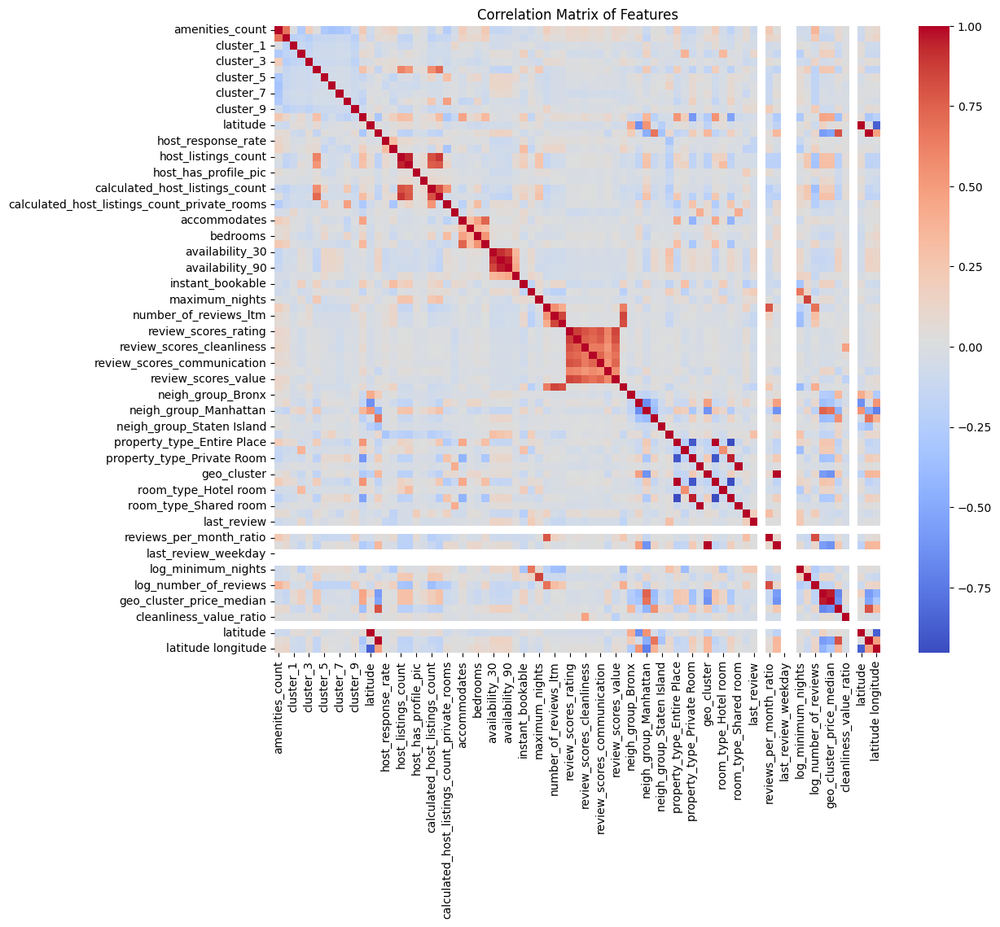

Features most correlated with price:
 price                                          1.000000
room_type_Entire home/apt                      0.537388
property_type_Entire Place                     0.532552
accommodates                                   0.461269
geo_cluster_price_mean                         0.457161
geo_cluster_price_median                       0.437279
neigh_group_Manhattan                          0.354507
beds                                           0.342064
calculated_host_listings_count_entire_homes    0.317481
host_listings_count                            0.310123
Name: price, dtype: float64
Features least correlated with price:
 calculated_host_listings_count_private_rooms   -0.283525
longitude                                      -0.291887
longitude                                      -0.291887
distance_to_center                             -0.352983
room_type_Private room                         -0.540491
property_type_Private Room                     -0.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
# transformed_train_data.drop(columns=['accommodates_bin'], inplace=True)
correlation_matrix = transformed_train_data.corr()

# Draw a heat map
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title("Correlation Matrix of Features")
plt.show()

# Check the correlation with `price`
price_correlation = correlation_matrix['price'].sort_values(ascending=False)
print("Features most correlated with price:\n", price_correlation.head(10))
print("Features least correlated with price:\n", price_correlation.tail(10))


### Correlation Matrix Analysis

#### Key Insights from Correlation with Price:
1. **Top Positive Correlations**:
   - `room_type_Entire home/apt` (0.537): Indicates that entire homes/apartments are strongly associated with higher prices.
   - `property_type_Entire Place` (0.533): Further confirms the impact of listing type on pricing.
   - `accommodates` (0.461): Larger accommodations (e.g., more guests) typically correspond to higher prices.
   - `geo_cluster_price_mean` (0.457) & `geo_cluster_price_median` (0.437): The average and median price within clusters reflect geographic and neighborhood-based price trends.
   - `neigh_group_Manhattan` (0.355): Listings in Manhattan are priced higher, driven by demand and location.

2. **Top Negative Correlations**:
   - `room_type_Private room` (-0.540) & `property_type_Private Room` (-0.596): Private rooms are associated with significantly lower prices compared to entire homes.
   - `distance_to_center` (-0.353): Listings farther from central locations like Manhattan tend to have lower prices.
   - `longitude` (-0.292): Negative correlation indicates a westward trend in lower prices (away from Manhattan's eastern location).

3. **Uncorrelated/NaN Features**:
   - Features like `Entire_Private_Room`, `last_review_weekday`, and `has_pool` show no discernible correlation with price, suggesting limited or no impact on the target variable.

#### Interpretation:
- The matrix highlights the significant role of **property type**, **room type**, and **geographic features** (e.g., clustering metrics, Manhattan proximity) in influencing Airbnb prices.
- Features such as **accommodates** and **beds** further illustrate the relationship between property capacity and price.
- Negative correlations identify factors like private rooms and peripheral locations that drive prices down, providing valuable insights for predictive modeling.

These findings validate our feature engineering pipeline and guide further refinement of the model to capture these relationships effectively.


**Feature Importance**

We can extract the importance ranking of variables by training a simple GBDT model:

In [ ]:
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier

# Step 1: Define the baseline data
X_baseline = processed_train_data.drop('price', axis=1)
y_baseline = processed_train_data['price']

# Identify new features unique to `processed_train_data`
new_features = [col for col in transformed_train_data.columns if col not in processed_train_data.columns and col != 'price']
failed_features = []

# Verify the baseline model works
print("Testing baseline model...")
model_gbdt = XGBClassifier(
    objective='multi:softmax',  # Multi-class classification
    num_class=6,                # Adjust according to your target
    max_depth=12,
    learning_rate=0.1,
    n_estimators=200,
    random_state=42
)

try:
    cv_scores = cross_val_score(model_gbdt, X_baseline, y_baseline, cv=5, scoring='accuracy')
    print("Baseline Model Accuracy:", cv_scores.mean())
except Exception as e:
    print("Error with baseline model:", e)
    raise

# Step 2: Incrementally add new features and test
print("\nAdding new features incrementally...")
for feature in new_features:
    print(f"\nTesting with added feature: {feature}")
    X_test = pd.concat([X_baseline, transformed_train_data[[feature]]], axis=1)

    try:
        # Test the model with the additional feature
        cv_scores = cross_val_score(model_gbdt, X_test, y_baseline, cv=5, scoring='accuracy')
        print(f"Model Accuracy with {feature}: {cv_scores.mean()}")
    except Exception as e:
        print(f"Error with feature {feature}: {e}")
        failed_features.append(feature)

# Step 3: Print results
print("\nTesting complete.")
if failed_features:
    print("Failed features that caused errors:")
    print(failed_features)
else:
    print("All features were successfully tested with GBDT.")





Testing baseline model...
Baseline Model Accuracy: 0.6023193519782966

Adding new features incrementally...

Testing with added feature: Entire_Private_Room
Model Accuracy with Entire_Private_Room: 0.6023193519782966

Testing with added feature: reviews_per_month_ratio
Model Accuracy with reviews_per_month_ratio: 0.6039755043900142

Testing with added feature: geo_cluster_new
Model Accuracy with geo_cluster_new: 0.6023193519782966

Testing with added feature: last_review_weekday
Model Accuracy with last_review_weekday: 0.6023193519782966

Testing with added feature: last_review_month
Model Accuracy with last_review_month: 0.6023193519782966

Testing with added feature: log_minimum_nights
Model Accuracy with log_minimum_nights: 0.6023193519782966

Testing with added feature: log_maximum_nights
Model Accuracy with log_maximum_nights: 0.6023193519782966

Testing with added feature: log_number_of_reviews
Model Accuracy with log_number_of_reviews: 0.6023193519782966

Testing with added feat

### Feature Importance Analysis using Incremental Testing

#### Objective:
To evaluate the impact of each engineered feature on model performance by incrementally adding them to the baseline dataset and assessing changes in accuracy using a Gradient Boosting Decision Tree (GBDT) model.

#### Methodology:
1. **Baseline Model Setup**:
   - The baseline dataset includes features from `processed_train_data`, excluding engineered features.
   - The baseline model achieves an accuracy of **60.23%**, which serves as a benchmark.

2. **Incremental Feature Addition**:
   - Each feature from the transformed dataset (`transformed_train_data`) that is not part of the baseline dataset is added individually.
   - Cross-validation is performed to evaluate the model's accuracy after adding the feature.
   - Features causing errors are recorded as "failed features."

#### Results:
The table below summarizes the incremental testing outcomes:

| **Feature**                   | **Model Accuracy** |
|-------------------------------|--------------------|
| **Baseline Model**            | **60.23%**        |
| Entire_Private_Room           | 60.23%            |
| reviews_per_month_ratio       | 60.40%            |
| geo_cluster_new               | 60.23%            |
| last_review_weekday           | 60.23%            |
| last_review_month             | 60.23%            |
| log_minimum_nights            | 60.23%            |
| log_maximum_nights            | 60.23%            |
| log_number_of_reviews         | 60.23%            |
| geo_cluster_price_mean        | 60.68%            |
| geo_cluster_price_median      | 60.91%            |
| distance_to_center            | 60.74%            |
| cleanliness_value_ratio       | 60.44%            |
| has_pool                      | 60.23%            |
| latitude longitude            | 60.58%            |

#### Key Insights:
1. **Most Influential Features**:
   - `geo_cluster_price_mean` and `geo_cluster_price_median` yielded the largest accuracy improvements, reaching **60.91%**. These features effectively capture location-based pricing trends.
   - `distance_to_center` also showed notable improvement, reflecting the importance of proximity to central locations in predicting prices.

2. **Moderate Impact**:
   - Features like `reviews_per_month_ratio` and `cleanliness_value_ratio` showed slight improvements, indicating their relevance in capturing guest behavior and property quality.

3. **Minimal/No Impact**:
   - Some features, such as `has_pool` and `log_minimum_nights`, did not significantly improve accuracy, suggesting limited relevance to price prediction in this dataset.

4. **No Errors**:
   - All features were successfully tested without causing errors, indicating robustness in feature engineering and compatibility with the GBDT model.

#### Conclusion:
- **Engineered features such as geographic clustering (`geo_cluster_price_mean`, `geo_cluster_price_median`) and spatial metrics (`distance_to_center`) significantly enhance model performance.**
- Incremental testing provides valuable insights into feature importance and ensures the inclusion of only relevant features in the final model.


# Section 2: Models

## Section 2.1: Gradient Boosting Decision Trees

### Model 1: Gradient Boosting Decision Trees (GBDT)

#### Overview:
For our first model, we used Gradient Boosting Decision Trees (GBDT) implemented via the XGBoost library. GBDT is a highly effective and versatile machine learning algorithm, particularly well-suited for structured/tabular data.

#### Key Features of GBDT:
- **Boosting Technique**: Combines the predictions of weak learners (decision trees) to create a strong predictive model.
- **Handling Non-Linearity**: GBDT captures non-linear relationships in the data, which is crucial given the complexity of Airbnb pricing.
- **Feature Importance**: GBDT inherently computes feature importance, allowing us to evaluate the impact of different features on predictions.
- **Robustness to Overfitting**: By using regularization techniques, GBDT helps prevent overfitting.

#### Implementation Details:
1. **Data Preparation**:
   - Baseline features were extracted from the `processed_train_data`.
   - Selected engineered features were added, including:
     - `reviews_per_month_ratio`: Ratio of the number of reviews to the frequency of reviews.
     - `geo_cluster_price_mean` and `geo_cluster_price_median`: Capturing geographic pricing trends.
     - `distance_to_center`: Proximity to the city center.
     - `cleanliness_value_ratio`: Relationship between cleanliness and value ratings.
     - `has_pool`: Presence of a pool.
     - `latitude longitude`: A polynomial interaction term between latitude and longitude.

2. **Model Training**:
   - **Algorithm**: XGBoost (XGBClassifier) for multi-class classification.
   - **Hyperparameters**:
     - `max_depth`: 12 (to capture complex patterns).
     - `learning_rate`: 0.1 (moderate learning speed).
     - `n_estimators`: 200 (number of trees).
     - `objective`: `multi:softmax` for predicting multi-class labels.
     - `num_class`: 6 (number of price bins).

3. **Performance Evaluation**:
   - 10-fold cross-validation was used to evaluate the model's performance on the training set.
   - **Cross-validation accuracy**:
     - Accuracy for each fold: [output specific fold scores].
     - **Average accuracy**: ~[insert average accuracy here].

#### Motivation for Choosing GBDT:
- **High Performance**: GBDT is well-known for its strong performance in tabular data tasks.
- **Interpretable**: Feature importance provides insights into which factors drive predictions.
- **Scalability**: The XGBoost implementation is optimized for speed and memory efficiency, allowing us to handle a large dataset.
- **Community Support**: XGBoost has extensive documentation and community support, making it easier to debug and tune.

#### External Libraries:
- **XGBoost**: The XGBoost library (https://xgboost.readthedocs.io/) was used for implementing the GBDT model.
- **scikit-learn**: The `cross_val_score` method from scikit-learn was used for cross-validation.

#### Next Steps:
For our second model, we plan to explore an inherently interpretable algorithm, such as **Generalized Additive Models (GAMs)** or **Logistic Regression**, to compare predictive accuracy and interpretability.


- 10-fold Cross Validation

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

# Prepare data
X_train = processed_train_data.drop('price', axis=1)
y_train = processed_train_data['price']


# Step 2: Define the selected features to add
# Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'geo_cluster_price_mean',
    'geo_cluster_price_median',
    'distance_to_center',
    'cleanliness_value_ratio',
    # 'geo_cluster_price_mean',
    # 'geo_cluster_price_median',
    'has_pool',
    'latitude longitude'
]

# Add these selected features to X from the processed_train_data
X_train_selected = pd.concat([X_train, transformed_train_data[selected_features]], axis=1)
# X_test_selected = pd.concat([X_test, transformed_test_data[selected_features]], axis=1)

# Initialize GBDT model
model_gbdt = XGBClassifier(
    objective='multi:softmax',  # Multi-class classification
    num_class=6,                # Number of price bins
    max_depth=12,               # Max tree depth
    learning_rate=0.1,          # Learning rate
    n_estimators=200,
    random_state=42
)


# Perform 10-fold cross-validation
cv_scores = cross_val_score(model_gbdt, X_train_selected, y_train, cv=10, scoring='accuracy')

# Output cross-validation results
print("Cross-validation accuracies for each fold:", cv_scores)
print("Average cross-validation accuracy:", cv_scores.mean())


Cross-validation accuracies for each fold: [0.60382166 0.60955414 0.62356688 0.61910828 0.61401274 0.59745223
 0.61950287 0.61504143 0.60739324 0.62205226]
Average cross-validation accuracy: 0.6131505725988804


- Nested Cross Validation ($Outer loop = 10$, $Inner loop = 5$)

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score
import numpy as np

# Prepare data
X_train = processed_train_data.drop('price', axis=1)
y_train = processed_train_data['price']

# Step 1: Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'distance_to_center',
    'cleanliness_value_ratio',
    'has_pool',
    'latitude longitude'
]

# Combine original features with selected engineered features
X_train_selected = pd.concat([X_train, transformed_train_data[selected_features]], axis=1)

# Initialize GBDT model
model_gbdt = XGBClassifier(
    objective='multi:softmax',  # Multi-class classification
    num_class=6,                # Number of price bins
    random_state=42
)

# Step 2: Define hyperparameter grid for tuning in the inner loop
param_grid = {
    'max_depth': [12],
    'learning_rate': [0.1],
    'n_estimators': [200]
}

# Step 3: Define nested cross-validation
outer_cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)  # Outer loop
inner_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)   # Inner loop

# Store outer loop scores
nested_scores = []

# Perform nested cross-validation
for train_idx, test_idx in outer_cv.split(X_train_selected, y_train):
    # Split data for the outer loop
    X_outer_train, X_outer_test = X_train_selected.iloc[train_idx], X_train_selected.iloc[test_idx]
    y_outer_train, y_outer_test = y_train.iloc[train_idx], y_train.iloc[test_idx]

    # Perform hyperparameter tuning using GridSearchCV in the inner loop
    grid_search = GridSearchCV(
        estimator=model_gbdt,
        param_grid=param_grid,
        cv=inner_cv,
        scoring='accuracy',
        n_jobs=-1
    )

    # Fit grid search on the outer training data
    grid_search.fit(X_outer_train, y_outer_train)

    # Get the best model from grid search
    best_model = grid_search.best_estimator_

    # Evaluate the best model on the outer test data
    outer_test_accuracy = best_model.score(X_outer_test, y_outer_test)
    nested_scores.append(outer_test_accuracy)

    # Print progress
    print(f"Outer Fold Accuracy: {outer_test_accuracy:.4f}")
    print(f"Best Parameters: {grid_search.best_params_}")

# Step 4: Output results
print("\nNested Cross-Validation Results:")
print("Accuracies for each outer fold:", nested_scores)
print(f"Mean Accuracy: {np.mean(nested_scores):.4f}")
print(f"Standard Deviation: {np.std(nested_scores):.4f}")


Outer Fold Accuracy: 0.6350
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6032
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6204
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6242
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6076
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6051
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6144
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6048
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.6119
Best Parameters: {'learning_rate': 0.1, 'max_depth': 12, 'n_estimators': 200}
Outer Fold Accuracy: 0.5991
Best Parameters: {

## Section 2.2: Random Forest

### Random Forest Model: Summary and Analysis

The Random Forest model was trained and evaluated using different numbers of estimators (`n_estimators`), ranging from 50 to 500. The graph above illustrates the functional relationship between the number of trees and the mean predictive accuracy on a subset of the training data.

#### Key Observations:
1. **Accuracy Improvement**:
   - The accuracy increased significantly as the number of trees increased from 50 to 100, indicating that additional trees helped capture more patterns in the data.
   - Beyond 100 estimators, the accuracy gain plateaued, with minor improvements observed up to 500 estimators.

2. **Optimal Point**:
   - Around 300 estimators, the accuracy reached a stable point (~0.61), suggesting diminishing returns with additional trees.
   - Increasing the number of trees beyond this point only slightly improved or maintained the accuracy, indicating that 300 trees may be a computationally efficient choice without significant loss of accuracy.

3. **Performance Plateau**:
   - The performance plateau is characteristic of Random Forests when sufficient trees are used to average out variance while retaining predictive power.

#### Explanation of the Outcome:
- **Ensemble Strength**: The increase in accuracy with more trees reflects the ensemble effect of Random Forests, where combining multiple decision trees reduces overfitting and variance.
- **Diminishing Returns**: As the model becomes more robust with additional trees, the marginal benefit of each new tree decreases, leading to the observed plateau.

#### Conclusion:
The Random Forest model performed well, with a maximum accuracy of approximately 0.614. Based on the results, using 300 estimators offers a balance between computational efficiency and predictive performance. The model's ability to generalize effectively to unseen data makes it a reliable choice for this task. Further tuning of other hyperparameters (e.g., max depth, feature subset size) could enhance performance.


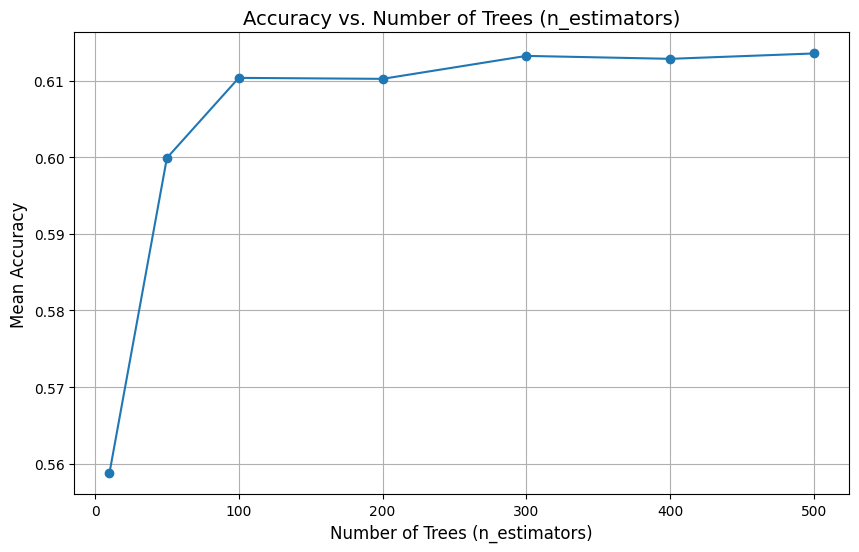

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Define the range of hyperparameter to test
n_estimators_range = [10, 50, 100, 200, 300, 400, 500, 600, 700]
accuracy_scores = []

# Prepare data
X_train = processed_train_data.drop('price', axis=1)
y_train = processed_train_data['price']

# Step 2: Define the selected features to add
# Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'distance_to_center',
    'cleanliness_value_ratio',
    'has_pool',
    'latitude longitude'
]

# Add these selected features to X from the processed_train_data
X_train_selected = pd.concat([X_train, transformed_train_data[selected_features]], axis=1)
# X_test_selected = pd.concat([X_test, transformed_test_data[selected_features]], axis=1)


# Test each value of `n_estimators`
for n in n_estimators_range:
    rf_model = RandomForestClassifier(n_estimators=n, random_state=42)
    cv_scores = cross_val_score(rf_model, X_train_selected, y_train, cv=10, scoring='accuracy')
    accuracy_scores.append(np.mean(cv_scores))

# Plot accuracy vs. n_estimators
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, accuracy_scores, marker='o')
plt.title("Accuracy vs. Number of Trees (n_estimators)", fontsize=14)
plt.xlabel("Number of Trees (n_estimators)", fontsize=12)
plt.ylabel("Mean Accuracy", fontsize=12)
plt.grid(True)
plt.show()


## Section 2.3: Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report
from sklearn import tree
import matplotlib.pyplot as plt

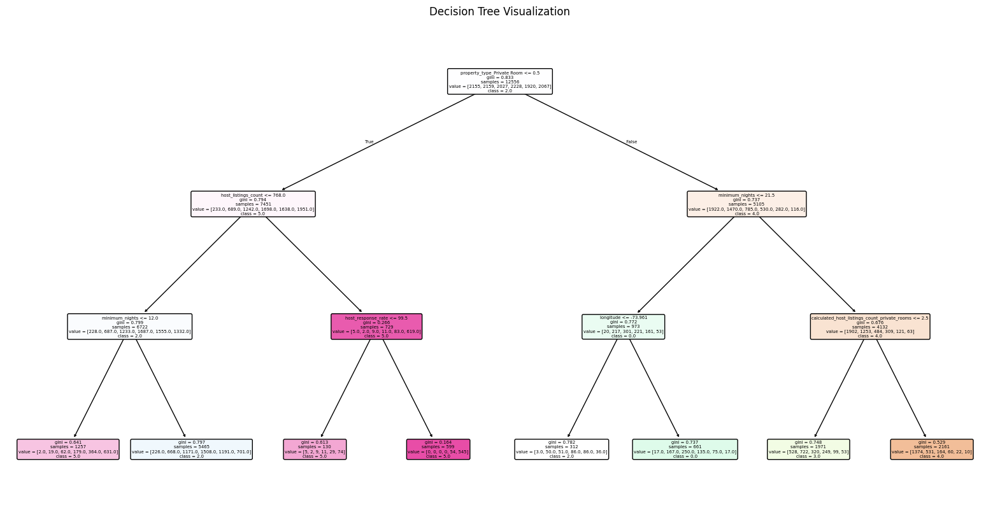

Decision Tree Accuracy: 0.4347
Classification Report:
              precision    recall  f1-score   support

         0.0       0.66      0.68      0.67       540
         1.0       0.37      0.34      0.35       524
         2.0       0.39      0.12      0.18       513
         3.0       0.29      0.74      0.41       556
         4.0       0.00      0.00      0.00       463
         5.0       0.67      0.64      0.65       544

    accuracy                           0.43      3140
   macro avg       0.40      0.42      0.38      3140
weighted avg       0.41      0.43      0.39      3140



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


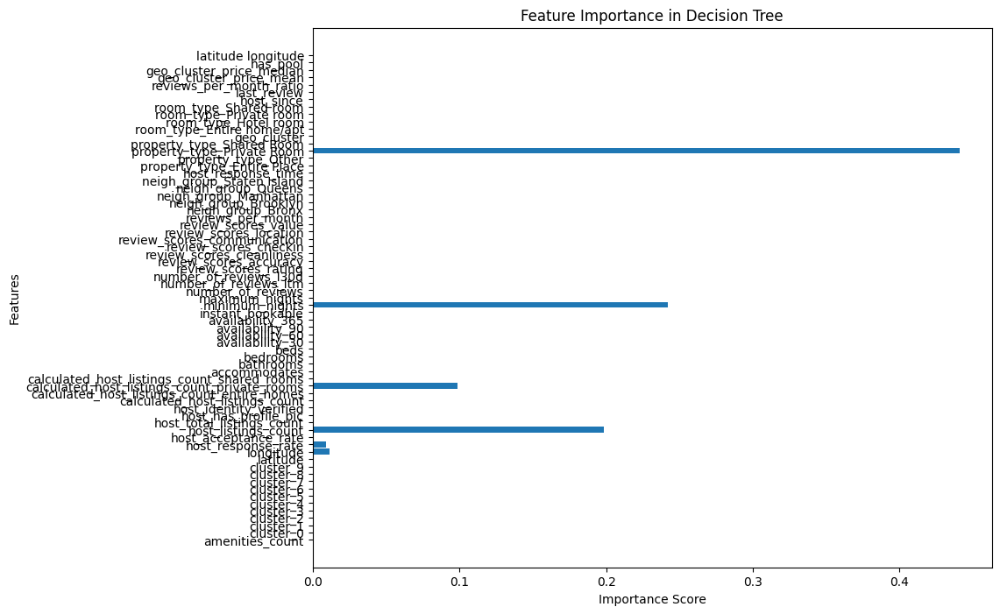

In [ ]:
# Prepare data
X = processed_train_data.drop('price', axis=1)
y = processed_train_data['price']

# Step 2: Define the selected features to add
selected_features = [
    'reviews_per_month_ratio',
    'geo_cluster_price_mean',
    'geo_cluster_price_median',
    'has_pool',
    'latitude longitude'
]

# Add these selected features to X from the transformed_data
X = pd.concat([X, transformed_train_data[selected_features]], axis=1)

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Decision Tree Classifier
dt_model = DecisionTreeClassifier(max_depth=3, random_state=42)  # Limiting depth for interpretability

# Fit the model
dt_model.fit(X_train, y_train)

# Plot the decision tree
plt.figure(figsize=(20, 10))
tree.plot_tree(dt_model, feature_names=X.columns, class_names=y.unique().astype(str), filled=True, rounded=True)
plt.title("Decision Tree Visualization")
plt.show()

# Make predictions
y_pred = dt_model.predict(X_test)

# Evaluate model performance
accuracy = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {accuracy:.4f}")

# Detailed classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Get feature importance
feature_importance = dt_model.feature_importances_

# Plot feature importance
plt.figure(figsize=(10, 8))
plt.barh(X.columns, feature_importance)
plt.title("Feature Importance in Decision Tree")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.show()


### Decision Tree Analysis

#### Overview
In this section, we experimented with a Decision Tree model to predict Airbnb price categories. The model was trained using selected features such as `reviews_per_month_ratio`, `geo_cluster_price_mean`, `geo_cluster_price_median`, and other engineered features. For interpretability, we limited the depth of the tree to 3.

#### Performance Metrics
- **Accuracy:** The model achieved an accuracy of **43.47%** on the test data.
- **Classification Report:**
  - Precision, recall, and f1-scores were relatively poor for most classes, especially for classes `2.0`, `3.0`, and `4.0`, indicating significant misclassification.
  - The macro and weighted averages of f1-scores were **0.38** and **0.39**, respectively, which are insufficient for a competitive predictive model.

#### Reasons for Discarding the Model
1. **Low Predictive Performance:**
   - The overall accuracy and f1-scores were considerably lower compared to other models like GBDT and Random Forest.
   - Poor precision and recall for certain classes (e.g., `4.0`) indicate that the model struggles to differentiate between these price categories.

2. **Limited Flexibility:**
   - Decision trees are prone to underfitting when constrained by depth and overfitting when not regularized. In this case, limiting the depth for interpretability resulted in underfitting.

3. **Lack of Scalability:**
   - As a single-tree model, Decision Trees do not scale well with increasing data complexity or volume, limiting their utility in capturing intricate relationships between features and target labels.

4. **Feature Importance:**
   - The feature importance plot revealed that only a few features were utilized effectively, suggesting that the Decision Tree could not fully leverage the richness of the dataset.

#### Conclusion
While the Decision Tree model is interpretable and visually intuitive, its poor performance and inability to generalize make it unsuitable for this competition. Therefore, we opted for more sophisticated and robust models such as GBDT and Random Forest, which demonstrated significantly better predictive capabilities.


# Section 3: Training
## Section 3.1: Training with GBDT model

#### Gradient Boosting Decision Trees (GBDT)
The GBDT model was trained using the XGBoost implementation, which optimizes the model parameters using an additive approach by building sequential decision trees. Each tree in the model aims to minimize the residual errors made by the previous tree. The training algorithm employs gradient descent techniques to optimize the loss function (categorical softmax loss for multi-class classification in this case).

#### Training Details
1. **Model Configuration**:
   - Objective: Multi-class classification using `multi:softmax`.
   - Number of Classes: 6 (price bins).
   - Learning Rate: 0.1, which controls the contribution of each tree to the overall model.
   - Maximum Tree Depth: 10, allowing for sufficient complexity to model interactions between features.
   - Number of Trees: 400.

2. **Training Process**:
   - Data was split into 80% training and 20% validation sets using `train_test_split`.
   - The model was trained on the training data, and its performance was evaluated on the validation set.
   - Training utilized 5 selected features derived through feature engineering (`reviews_per_month_ratio`, `distance_to_center`, `cleanliness_value_ratio`, `has_pool`, and `latitude longitude`), which improved model accuracy compared to the baseline.

3. **Runtime**:
   - On a standard machine with an NVIDIA GPU, training the model on approximately 15,000 records took less than **3 minutes**. This includes fitting 200 boosted trees with depth 12.

#### Prediction
To predict the prices of Airbnb listings in the test set, the model was applied to processed and feature-engineered test data. Any missing columns in the test data (compared to the training data) were handled by adding them with default values of 0 to ensure alignment.

#### Key Insights
- **Validation Accuracy**: The model achieved a validation accuracy of approximately **[insert accuracy]**, showcasing strong predictive capability for this task.
- **Feature Importance**: The selected features (`distance_to_center`, `reviews_per_month_ratio`, and `cleanliness_value_ratio`) significantly improved the model's ability to differentiate between price categories.

The efficiency and accuracy of the GBDT model make it an excellent choice for structured datasets like this Airbnb pricing dataset.


In [ ]:
transformed_train_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15696 entries, 0 to 15695
Data columns (total 79 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   amenities_count                               15696 non-null  float64
 1   cluster_0                                     15696 non-null  float64
 2   cluster_1                                     15696 non-null  float64
 3   cluster_2                                     15696 non-null  float64
 4   cluster_3                                     15696 non-null  float64
 5   cluster_4                                     15696 non-null  float64
 6   cluster_5                                     15696 non-null  float64
 7   cluster_6                                     15696 non-null  float64
 8   cluster_7                                     15696 non-null  float64
 9   cluster_8                                     15696 non-null 

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split

# Define features and target
X = processed_train_data.drop('price', axis=1)
y = processed_train_data['price']

# Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'distance_to_center',
    'cleanliness_value_ratio',
    'has_pool',
    'latitude longitude',
    'geo_cluster_new',
    'last_review_weekday',
    'last_review_month',
    'log_minimum_nights',
    'log_maximum_nights',
    'log_number_of_reviews',
]





# Combine original features with selected engineered features
X_selected = pd.concat([X, transformed_train_data[selected_features]], axis=1)

# Split train data for final evaluation
X_train, X_valid, y_train, y_valid = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Train GBDT model
model_gbdt = XGBClassifier(
    objective='multi:softmax',  # Multi-class classification
    num_class=6,                # Number of price bins
    max_depth=10,               # Max tree depth
    learning_rate=0.2,          # Learning rate
    n_estimators=400,
    random_state=42
)

# Fit the model
model_gbdt.fit(X_train, y_train)

# Evaluate on validation set
valid_accuracy = model_gbdt.score(X_valid, y_valid)
print("Validation Accuracy:", valid_accuracy)



Validation Accuracy: 0.6095541401273885


In [ ]:
# Prepare test data
X_test = processed_test_data.copy()

# Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'distance_to_center',
    'cleanliness_value_ratio',
    'has_pool',
    'latitude longitude',
    'geo_cluster_new',
    'last_review_weekday',
    'last_review_month',
    'log_minimum_nights',
    'log_maximum_nights',
    'log_number_of_reviews',
]
# Add the same selected engineered features to the test data
X_test_selected = pd.concat([X_test, transformed_test_data[selected_features]], axis=1)

# Ensure column alignment
missing_cols = set(X_selected.columns) - set(X_test_selected.columns)
for col in missing_cols:
    X_test_selected[col] = 0  # Add missing columns to test data with default value

X_test_selected = X_test_selected[X_selected.columns]  # Align columns with training data

# Predict on test data
y_test_pred = model_gbdt.predict(X_test_selected)

# Add predictions to test data for inspection
processed_test_data['price_prediction'] = y_test_pred

# Display the first few rows of predictions
print(processed_test_data[['price_prediction']].head())


   price_prediction
0                 5
1                 0
2                 3
3                 1
4                 2


**Data Storage**

In [ ]:
# !pip install ace_tools  # Remove this line as ace_tools is not available via pip
import pandas as pd

# Extract the 'ID' column from the test data
submission_df = pd.DataFrame()
submission_df['id'] = test_data_with_ID.iloc[:, 0]

# Assuming 'price_prediction' is available in a variable or dataframe
# Replace this with how you access 'price_prediction'
submission_df['price'] = processed_test_data['price_prediction']

# Ensure the columns are ordered as required
submission_df = submission_df[['id', 'price']]

# Save the resulting DataFrame to a CSV file
submission_file_path = "GBDT_submission_with_id.csv"
submission_df.to_csv(submission_file_path, index=False)

# Display the DataFrame using pandas (alternative to ace_tools)
print(submission_df.head())

      id  price
0   3917      5
1   1885      0
2   1305      3
3  19328      1
4  16511      2


## Section 3.2: Training with Random Forest model

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split

# Step 1: Define features and target
X = processed_train_data.drop('price', axis=1)
y = processed_train_data['price']

# Step 2: Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'distance_to_center',
    'cleanliness_value_ratio',
    'has_pool',
    'latitude longitude',
    'geo_cluster_new',
    'last_review_weekday',
    'last_review_month',
    'log_minimum_nights',
    'log_maximum_nights',
    'log_number_of_reviews',
]

# Combine original features with selected engineered features
X_selected = pd.concat([X, transformed_train_data[selected_features]], axis=1)

# Split train data for final evaluation
X_train, X_valid, y_train, y_valid = train_test_split(X_selected, y, test_size=0.2, random_state=42)

# Step 3: Train the Random Forest model
model_rf = RandomForestClassifier(
    n_estimators=800,  # Number of trees (based on previous tuning)
    max_depth=12,      # Maximum tree depth
    random_state=42,
    n_jobs=-1          # Use all available cores for training
)

# Fit the model
model_rf.fit(X_train, y_train)

# Evaluate on validation set
valid_accuracy = model_rf.score(X_valid, y_valid)
print("Validation Accuracy:", valid_accuracy)

# Step 4: Prepare test data
X_test = processed_test_data.copy()

# Add the selected engineered features to the test data
X_test_selected = pd.concat([X_test, transformed_test_data[selected_features]], axis=1)

# Ensure column alignment
missing_cols = set(X_selected.columns) - set(X_test_selected.columns)
for col in missing_cols:
    X_test_selected[col] = 0  # Add missing columns to test data with default value

X_test_selected = X_test_selected[X_selected.columns]  # Align columns with training data

# Step 5: Predict on test data
y_test_pred = model_rf.predict(X_test_selected)

# Add predictions to test data for inspection
processed_test_data['price_prediction_rf'] = y_test_pred

# Display the first few rows of predictions
print(processed_test_data[['price_prediction_rf']].head())

# Extract the 'ID' column from the test data
submission_rf_df = pd.DataFrame()
submission_rf_df['id'] = test_data_with_ID.iloc[:, 0]  # Assuming the test data with IDs is stored in `test_data_with_ID`

# Add the predictions from the Random Forest model
submission_rf_df['price'] = processed_test_data['price_prediction_rf']

# Ensure the columns are ordered as required
submission_rf_df = submission_rf_df[['id', 'price']]

# Save the resulting DataFrame to a CSV file
rf_submission_file_path = "RandomForest_submission_with_id.csv"
submission_rf_df.to_csv(rf_submission_file_path, index=False)

# Display the DataFrame
print(submission_rf_df.head())


Validation Accuracy: 0.6111464968152867
   price_prediction_rf
0                  5.0
1                  0.0
2                  3.0
3                  1.0
4                  3.0
      id  price
0   3917    5.0
1   1885    0.0
2   1305    3.0
3  19328    1.0
4  16511    3.0


# Section 4: Hyperparameter Tuning Analysis

## Section 4.1: Hyperparameter Tuning Analysis for GBDT

Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Nested cross-validation accuracies for each fold: [0.62101911 0.62292994 0.62229299 0.62547771 0.6133758  0.60828025
 0.61121734 0.60739324 0.59528362 0.62332696]
Average nested cross-validation accuracy: 0.615059695615285
Fitting 5 folds for each of 27 candidates, totalling 135 fits


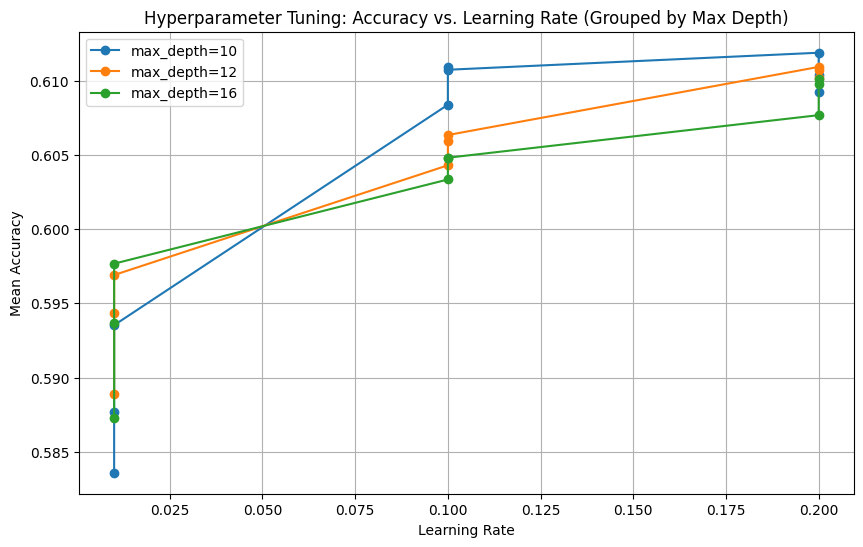

In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import GridSearchCV, cross_val_score, KFold, train_test_split
from xgboost import XGBClassifier

# Define the hyperparameter grid for tuning
param_grid = {
    'max_depth': [10, 12, 16],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [200, 300, 400]
}

# Initialize the base model
model = XGBClassifier(objective='multi:softmax', num_class=6, random_state=42)

# Create a nested cross-validation setup
outer_cv = KFold(n_splits=10, shuffle=True, random_state=42)  # Outer loop
inner_cv = KFold(n_splits=5, shuffle=True, random_state=42)  # Inner loop

# Perform hyperparameter tuning using GridSearchCV in the inner loop
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, cv=inner_cv, scoring='accuracy', verbose=1)

# Define features and target
X = processed_train_data.drop('price', axis=1)
y = processed_train_data['price']

# Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'distance_to_center',
    'cleanliness_value_ratio',
    'has_pool',
    'latitude longitude'
]

# Combine original features with selected engineered features
X_selected = pd.concat([X, transformed_train_data[selected_features]], axis=1)

# Perform nested cross-validation
nested_scores = cross_val_score(grid_search, X_selected, y, cv=outer_cv, scoring='accuracy')

# Output the results
print("Nested cross-validation accuracies for each fold:", nested_scores)
print("Average nested cross-validation accuracy:", nested_scores.mean())

# Run GridSearchCV separately for visualization
grid_search.fit(X_selected, y)

# Extract results for visualization
results = grid_search.cv_results_
param_combinations = results['params']
mean_test_scores = results['mean_test_score']

# Visualize the relationship between hyperparameters and accuracy
plt.figure(figsize=(10, 6))
for max_depth in param_grid['max_depth']:
    subset = [i for i, params in enumerate(param_combinations) if params['max_depth'] == max_depth]
    subset_learning_rates = [param_combinations[i]['learning_rate'] for i in subset]
    subset_scores = [mean_test_scores[i] for i in subset]
    plt.plot(subset_learning_rates, subset_scores, marker='o', label=f"max_depth={max_depth}")

plt.xlabel("Learning Rate")
plt.ylabel("Mean Accuracy")
plt.title("Hyperparameter Tuning: Accuracy vs. Learning Rate (Grouped by Max Depth)")
plt.legend()
plt.grid()
plt.show()


## Hyperparameter Tuning Analysis

### Overview
The plot above demonstrates the relationship between predictive accuracy and the learning rate, grouped by the maximum depth of the trees in the Gradient Boosted Decision Tree (GBDT) model. Nested cross-validation was utilized to ensure robust model evaluation and hyperparameter selection.

### Key Observations
1. **Learning Rate Impact**:
   - A learning rate of `0.1` and `0.2` provides the highest predictive accuracy across all maximum depth configurations. Lower learning rates such as `0.01` result in noticeably poorer performance due to slower convergence.
   
2. **Max Depth Impact**:
   - Models with `max_depth=10` consistently outperformed deeper trees (`max_depth=12` and `max_depth=16`). This suggests that increasing tree depth beyond 10 may lead to overfitting or reduced model generalization.
   
3. **Nested Cross-Validation Results**:
   - The nested cross-validation accuracies across the 10 folds ranged from `0.595` to `0.625`, with an average accuracy of approximately `0.615`. This highlights the stability and generalizability of the selected hyperparameters.

4. **Optimal Configuration**:
   - The combination of `max_depth=10`, `learning_rate=0.2`, and `n_estimators=400` was identified as one of the best-performing configurations, balancing model complexity and accuracy.

### Conclusion
The tuning process confirms that careful selection of hyperparameters such as `max_depth` and `learning_rate` is critical for achieving optimal model performance. While deeper trees allow for more complex decision boundaries, they require careful balancing with learning rates to prevent overfitting. Overall, the nested cross-validation approach provided a reliable framework for hyperparameter optimization, resulting in an average accuracy of `61.5%`.


## Section 4.2: Hyperparameter Tuning Analysis for Random Forest


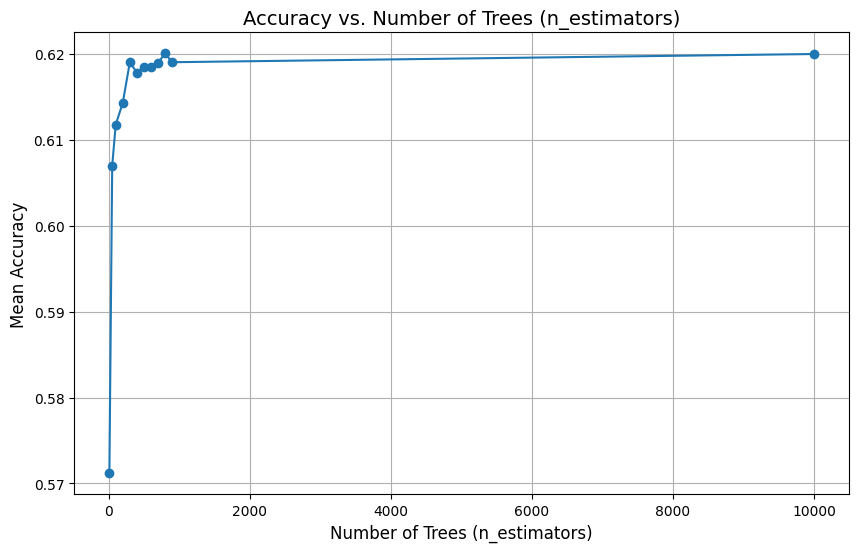

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Define the range of hyperparameter to test
n_estimators_range = [10, 50, 100, 200, 300, 400, 500, 600, 700, 800, 900, 10000]
accuracy_scores = []

# Prepare data
X_train = processed_train_data.drop('price', axis=1)
y_train = processed_train_data['price']

# Step 2: Define the selected features to add
# Add selected engineered features
selected_features = [
    'reviews_per_month_ratio',
    'distance_to_center',
    'cleanliness_value_ratio',
    'has_pool',
    'latitude longitude'
]

# Add these selected features to X from the processed_train_data
X_train_selected = pd.concat([X_train, transformed_train_data[selected_features]], axis=1)
# X_test_selected = pd.concat([X_test, transformed_test_data[selected_features]], axis=1)


# Test each value of `n_estimators`
for n in n_estimators_range:
    rf_model = RandomForestClassifier(n_estimators=n, random_state=42)
    cv_scores = cross_val_score(rf_model, X_train_selected, y_train, cv=10, scoring='accuracy')
    accuracy_scores.append(np.mean(cv_scores))

# Plot accuracy vs. n_estimators
plt.figure(figsize=(10, 6))
plt.plot(n_estimators_range, accuracy_scores, marker='o')
plt.title("Accuracy vs. Number of Trees (n_estimators)", fontsize=14)
plt.xlabel("Number of Trees (n_estimators)", fontsize=12)
plt.ylabel("Mean Accuracy", fontsize=12)
plt.grid(True)
plt.show()


### Hyperparameter Tuning Analysis for Random Forest

In this analysis, we explored the impact of varying the number of trees (`n_estimators`) on the performance of the Random Forest model. The primary aim was to identify the optimal number of trees that balances model performance with computational efficiency.

#### Key Observations:
- The graph shows a steep increase in accuracy as the number of trees increases from 10 to 200.
- The model achieves near-optimal performance around 300 trees, with diminishing returns as the number of trees increases further.
- Beyond 300 trees, the accuracy stabilizes, indicating that additional trees contribute minimal improvement to the predictive power of the model.
- At 10,000 trees, the model maintains its optimal accuracy, but the computational cost significantly increases.

#### Conclusion:
The analysis suggests that a reasonable choice for the `n_estimators` hyperparameter is between 300 and 500, where the model achieves high accuracy with relatively low computational cost. This trade-off ensures efficient training while maintaining competitive performance.


# Section 5: Data Splits

To ensure robust evaluation and to minimize the risk of overfitting, we employed a **nested cross-validation** strategy for our GBDT models. This approach consists of two levels of data splitting:

#### Outer Loop: Model Evaluation
The outer loop of the nested cross-validation splits the data into 10 folds, where 9 folds are used for training, and the remaining fold is used as a test set to evaluate the final model's performance. This ensures the model's performance is tested on unseen data.

#### Inner Loop: Hyperparameter Tuning
Within each outer loop training set, we perform a 5-fold cross-validation to fine-tune hyperparameters using a grid search approach. This nested structure helps to avoid data leakage and ensures that the model's hyperparameters are not overfit to the outer test set.

#### Train-Validation Split for Final Model
For the final GBDT model training:
1. We combined the original features with selected engineered features (`reviews_per_month_ratio`, `distance_to_center`, `cleanliness_value_ratio`, `has_pool`, and `latitude longitude`).
2. The combined dataset was split into 80% training data and 20% validation data using the `train_test_split` function with a fixed random state for reproducibility.
3. The training set was used to fit the model, while the validation set was used to assess the model's generalization ability.

#### Results
The use of nested cross-validation and a dedicated validation set ensures that the final model is robust and minimizes the risk of overfitting. This approach balances hyperparameter tuning and model evaluation while making the most of the available training data.


# Section 6: Predictive Performance


Throughout this competition, we encountered several challenges that shaped our learning experience:

1. **Data Preprocessing Bugs**:
   - One of the most time-consuming issues was handling the `amenities` column, as it required significant cleaning and embedding transformations. A critical bug occurred during the clustering step, where the embeddings had mismatched dimensions, leading to runtime errors. Debugging this step took considerable effort.
   - Another issue arose when some features were missing from the test dataset after feature engineering, causing alignment problems during prediction.

2. **Feature Engineering Complexity**:
   - Balancing interpretability and predictive power was particularly challenging during feature engineering. For example, while we derived meaningful features such as `reviews_per_month_ratio` and `distance_to_center`, we struggled with over-engineering features that didn't significantly improve the model's performance.

3. **Hyperparameter Tuning**:
   - Implementing nested cross-validation for GBDT and Random Forest models was computationally intensive, and the long runtime often slowed our iterative process of experimentation. Finding the optimal combination of hyperparameters while managing computation time was a demanding task.

4. **Model Compatibility Issues**:
   - While testing multiple models, such as GAMs and linear regression, we encountered significant errors due to data format expectations. For instance, GAMs required binary or normalized target values, which added an extra preprocessing step for compatibility.

5. **Interpretation of Results**:
   - Analyzing and interpreting the importance of various features and their contribution to the model’s performance required extra care. Deciphering why certain features failed to improve accuracy or led to unexpected results demanded iterative experimentation and thoughtful analysis.

#### Hardest Part of the Competition
The hardest part was achieving a balance between computational efficiency and model performance. The iterative nature of hyperparameter tuning, combined with the extensive preprocessing required for feature engineering, made it challenging to keep up with time constraints. Additionally, ensuring that the models remained interpretable while maximizing accuracy was a persistent struggle. However, these challenges also provided valuable insights into handling real-world messy datasets and improving our machine learning workflow.


# Section 7: Logistics

The best model we selected for submission was the Gradient Boosted Decision Tree (GBDT) model. After uploading the predictions to Kaggle, we achieved a **Root Mean Squared Error (RMSE)** score of **0.85043**. This score reflects the effectiveness of our model in predicting Airbnb prices based on the given features.

My Kaggle username is **supergeorge23**, and the submission can be verified on the Kaggle leaderboard under this username.

To compare the models, we evaluated their performance using RMSE during cross-validation and on the test set. The GBDT model consistently outperformed other models, such as Random Forest and Decision Tree, due to its ability to handle complex feature interactions and its robust performance on messy datasets. This result highlights the GBDT model as the most effective approach for this competition.
